# Initial Segmentation

This notebook will explore segmentation options for the 2 processed image data-sets


## Author: Alexander Goudemond, Student Number: 219030365

# Imports

In [1]:
from os import getcwd, walk, mkdir
from os.path import join

import cv2
from PIL.Image import fromarray

import numpy as np

import matplotlib.pyplot as plt

# Loading Test Images

This section of the notebook focusses on loading the first 10 images of each processed folder to explore segmentation

In [2]:

def getFirstTenPics(desired_directory, directory_array):
    # Now, generate the array of images
    test_images = []
    current_directory = getcwd()

    path = walk(current_directory+ "\\" + desired_directory)

    i = -1
    temp = -1
    for root, dirs, files in path:
        # print(dirs)
        for item in files:
            # only execute for first picture in directory
            if ("t0000.tif" in item) or ("t000.tif" in item):
                i += 1

                # skips folder "02" in data-sets
                if (i % 2 == 1):
                    break
                    
                # print(i)
                temp = i // 2

                # skip Challenge data-sets
                if ("(1)" in directory_array[temp]):
                    break

                location = ( current_directory + "\\" + desired_directory + "\\" + directory_array[temp] + 
                            "\\" + directory_array[temp] + "\\01\\" + item)
                # print(location)

                img = cv2.imread(location, cv2.IMREAD_GRAYSCALE)

                test_images.append(img) # place into array

                break

            else:
                break
            
    return resizeImageArray(test_images)
###

def resizeImageArray(image_array):
    new_array = []
    x = -1; y = -1

    for i in range(len(image_array)):
        img = image_array[i]

        if (i == 0):
            (x, y) = img.shape
            x = x // 2
            y = y // 2
        
        img_reshaped = cv2.resize(img, (x, y))
        new_array.append(img_reshaped)
    
    return new_array
###

In [3]:
'''
We only need to show every _OTHER_ folder, as each data-set has a 
 training and challenge set. So out of 20 files, we need to show 10

First things first, let us create an array of the directory locations
'''

data_sets = "..\\..\\Comp700_DataSets"
current_directory = getcwd()

path = walk(current_directory + "\\" + data_sets)

directory_array = [] # contains the main folders

i = 1
for root, dirs, files in path:
    if (i == 2):
        directory_array = dirs
        break
    
    i += 1

print("Directory Array")
print(directory_array)


Directory Array
['BF-C2DL-HSC', 'BF-C2DL-HSC (1)', 'BF-C2DL-MuSC', 'BF-C2DL-MuSC (1)', 'DIC-C2DH-HeLa', 'DIC-C2DH-HeLa (1)', 'Fluo-C2DL-Huh7', 'Fluo-C2DL-Huh7 (1)', 'Fluo-C2DL-MSC', 'Fluo-C2DL-MSC (1)', 'Fluo-N2DH-GOWT1', 'Fluo-N2DH-GOWT1 (1)', 'Fluo-N2DH-SIM+', 'Fluo-N2DH-SIM+ (1)', 'Fluo-N2DL-HeLa', 'Fluo-N2DL-HeLa (1)', 'PhC-C2DH-U373', 'PhC-C2DH-U373 (1)', 'PhC-C2DL-PSC', 'PhC-C2DL-PSC (1)']


In [4]:
location1 = "..\\..\\Comp700_Processed_DataSets_1"
location1_pics = getFirstTenPics(location1, directory_array)

print( len(location1_pics) )

10


In [5]:
location2 = "..\\..\\Comp700_Processed_DataSets_2"
location2_pics = getFirstTenPics(location2, directory_array)

print( len(location2_pics) )

10


In [6]:
# from PIL.Image import fromarray

def stitchTogetherPics(array_of_images):
    # top level
    myList = (array_of_images[0], array_of_images[1], array_of_images[2], array_of_images[3], array_of_images[4])
    numpy_horizontal_top = np.hstack(myList)

    # bottom level
    myList = (array_of_images[5], array_of_images[6], array_of_images[7], array_of_images[8], array_of_images[9])
    numpy_horizontal_bottom = np.hstack(myList)

    # stick 2 ontop of one another
    myList = (numpy_horizontal_top, numpy_horizontal_bottom)
    numpy_final_pic_concat = np.concatenate(myList, axis=0)

    return numpy_final_pic_concat
###

# save and show in cell
def saveAndShow(desired_directory, image_array, picName):
    fileName = desired_directory + "\\" + picName

    # Save pic to file, using Pillow!
    new_img = fromarray(stitchTogetherPics(image_array))
    new_img.save(fileName) # save using Pillow

    width = 30
    height = 10
    fig = plt.figure()
    fig.set_figwidth(width); fig.set_figheight(height)

    new_img = plt.imread(fileName)
    plt.title(picName)
    plt.axis('off')
    plt.imshow(new_img, cmap='gray')
###

def tryMakeDirectory(current_directory, destination_directory):
    try:
        # join comes from os.path
        mkdir( join(current_directory, destination_directory) )
    except FileExistsError:
        # print("Folder already exists!")
        pass
    except:
        print("Unknown Error Encountered...")
###

In [7]:
destination_directory = "007_Initial_Segmentation"
tryMakeDirectory(current_directory, destination_directory)

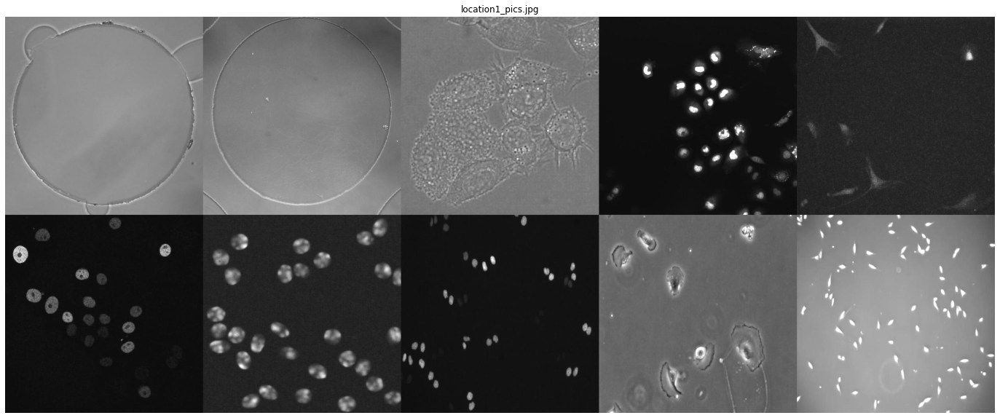

In [8]:
saveAndShow(destination_directory, location1_pics, "location1_pics.jpg")

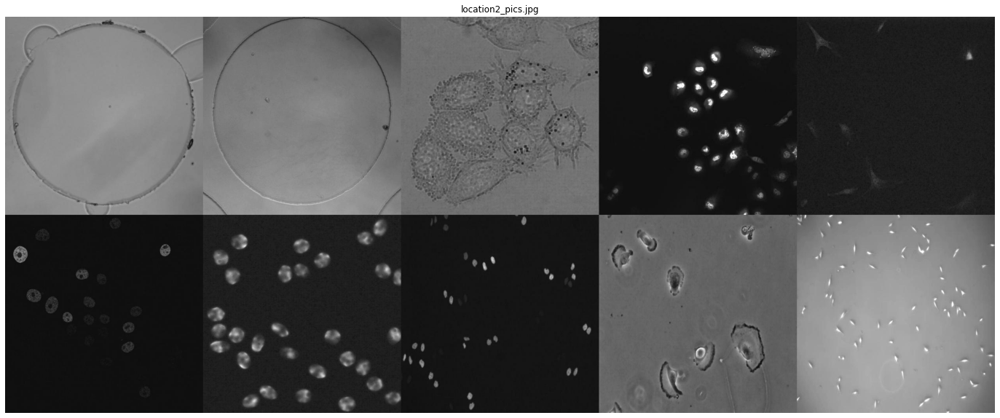

In [9]:
saveAndShow(destination_directory, location2_pics, "location2_pics.jpg")

Great! We now have the initial functions we need to save the work to our folder, as well as our 2 objects of test images

# Segmentation Options

This section of the notebook looks at segmentation options on our 2 test images

There are several segmentation options that can be used. Let us refer to our honours proposal for any non-deep learning techniques for segmentation. Let us look at the data gather in the proposal here:

![CTC Segmentation techniques](Proposal_Segmentation_Methods.PNG "CTC Segmentation techniques")

The CTC challenge focussed on algorithms for specific data-sets, so each team could have prepared seperate algorithms for each one present. I have already attempted the Pre Processing. Also, the thresholding attempted was almost successful, but not for all data-sets!

Instead, let us initially consider the following Methodologies: 

- Energy Minimization

- Region Growing

We can further attempt to segment the image, using:

- Watershed Segmentation

- Edge Detection

- K-Means Clustering

- Thresholding and Segmentation Combinations

## Watershed method:

In [10]:
def watershedSegmentation(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # noise removal
    kernel = np.ones((3,3),np.uint8)
    # print(kernel)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations = 2)

    # sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Finding unknown region
    unsure_pic = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, unsure_pic)

    # Marker labelling
    ret, markers = cv2.connectedComponents(unsure_pic)

    # Add one to all labels so that sure background is not 0, but 1
    markers = markers + 1

    # Now, mark the region of unknown with zero
    markers[unknown==255] = 0

    # NOW - Watershed method
    watershedImage = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    finalMarkers = cv2.watershed(watershedImage, markers) #! needs colour image

    watershedImage[finalMarkers == -1] = [255, 0, 0]
    watershedImage = cv2.cvtColor(watershedImage, cv2.COLOR_BGR2GRAY) #! convert back to grayscale

    return watershedImage

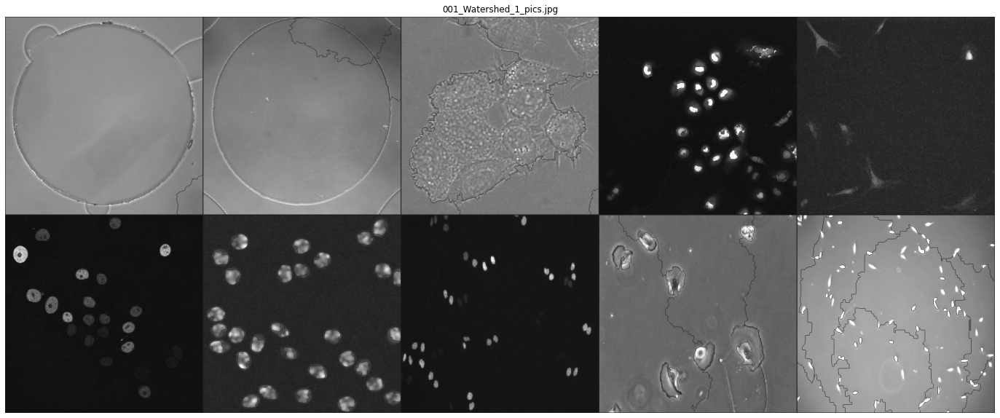

In [11]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedSegmentation(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "001_Watershed_1_pics.jpg")

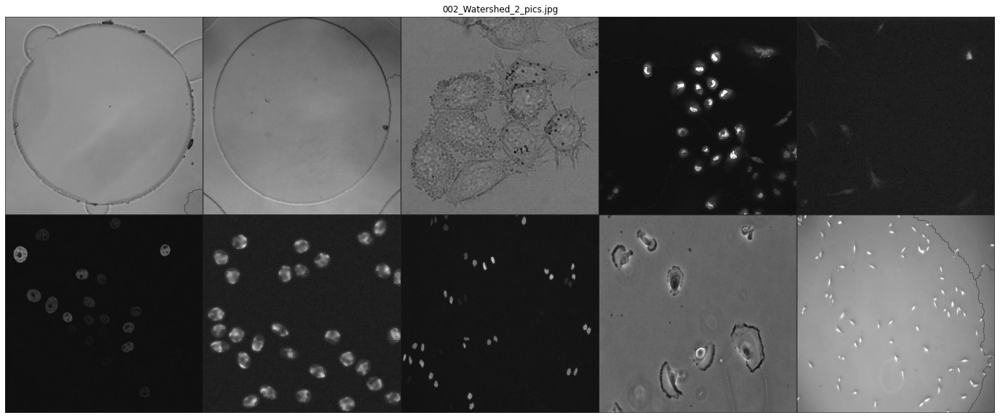

In [12]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedSegmentation(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "002_Watershed_2_pics.jpg")

Curiously, Watershed method performed better for locations1 than locations2. Perhaps the thresholding is the problem? Let us check:

In [13]:
def watershedThresholding(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    return thresh

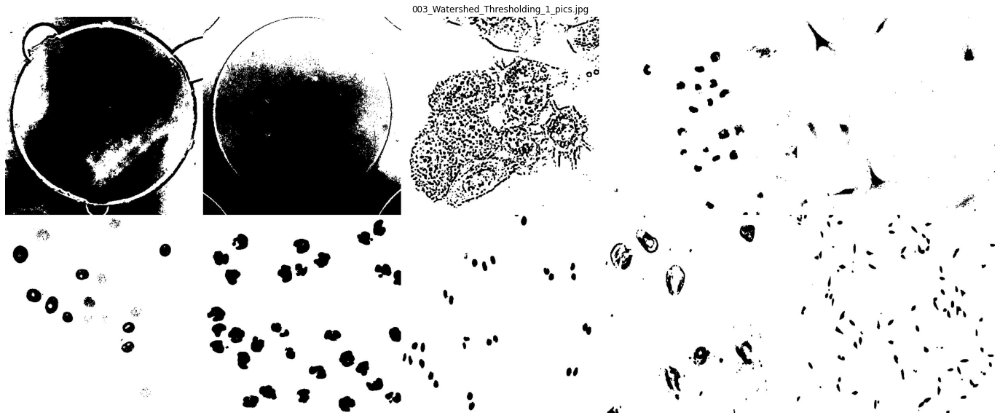

In [14]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholding(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "003_Watershed_Thresholding_1_pics.jpg")

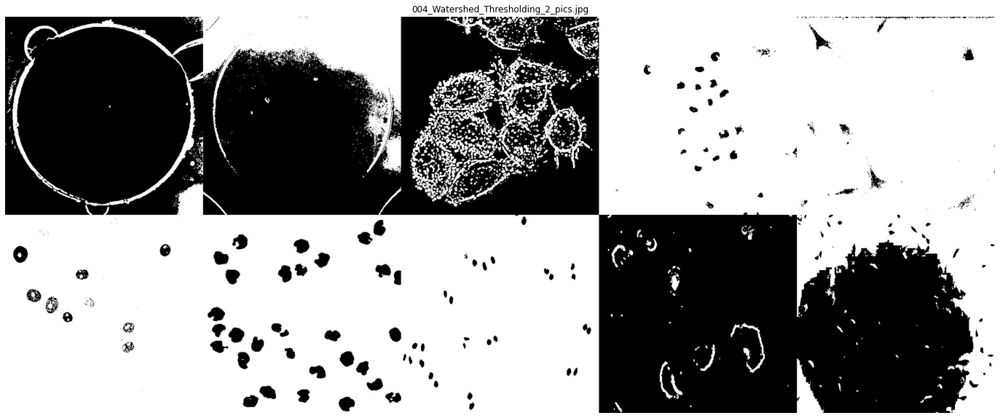

In [15]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholding(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "004_Watershed_Thresholding_2_pics.jpg")

Hay! Those thresholded pictures are great! They have problems for the first 2 and last data-sets (Namely because of the lighting) but the 3rd data-set is preserved well! We did not pick this up in processing because we did not consider using Masks through OpenCV!

What if we try that again, but using the adaptive thresholding instead of Otsu?

In [16]:
def watershedThresholdingAdapted(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.ADAPTIVE_THRESH_MEAN_C)

    return thresh

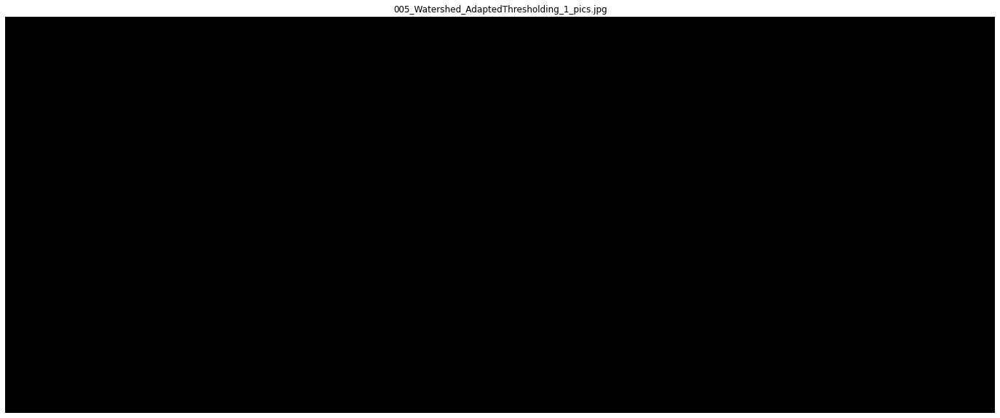

In [17]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "005_Watershed_AdaptedThresholding_1_pics.jpg")

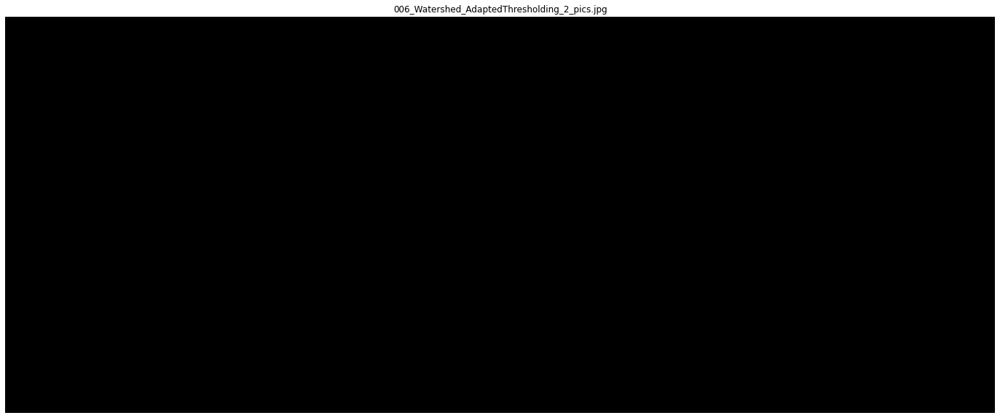

In [18]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "006_Watershed_AdaptedThresholding_2_pics.jpg")

Nope! just 1 variable?

In [19]:
def watershedThresholdingAdapted2(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.ADAPTIVE_THRESH_MEAN_C)

    return thresh

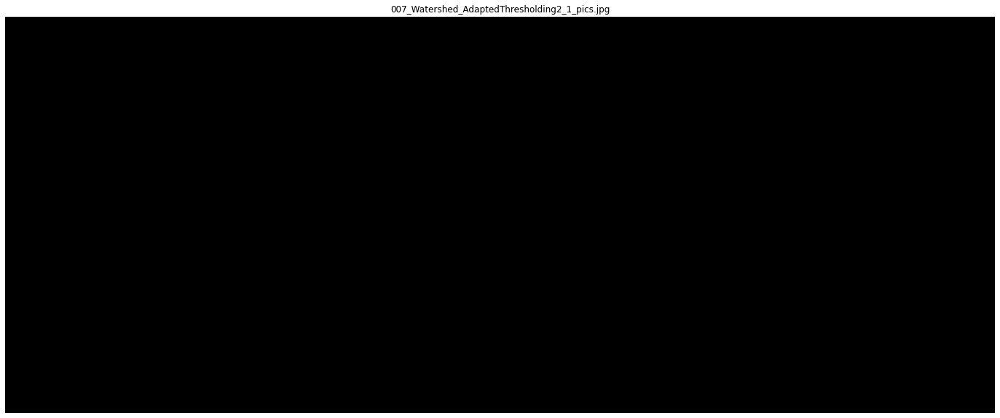

In [20]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted2(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "007_Watershed_AdaptedThresholding2_1_pics.jpg")

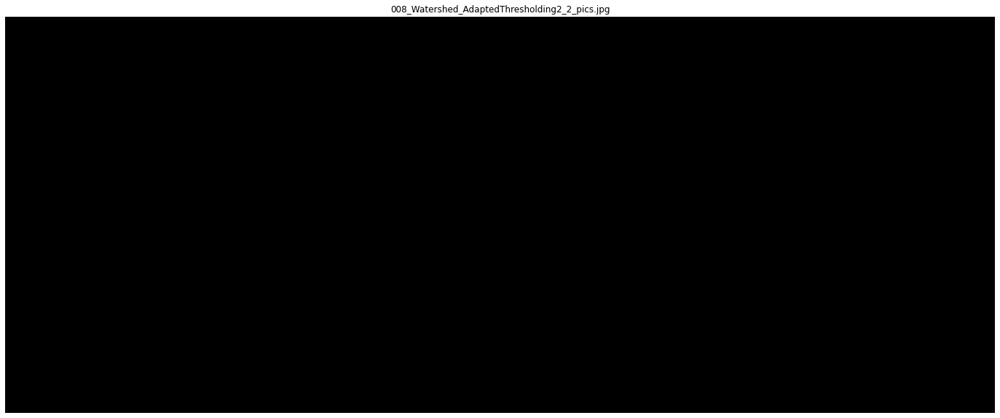

In [21]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted2(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "008_Watershed_AdaptedThresholding2_2_pics.jpg")

No, that option is terrible... What about other combinations?

In [22]:
def watershedThresholdingAdapted3(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_MASK)

    return thresh

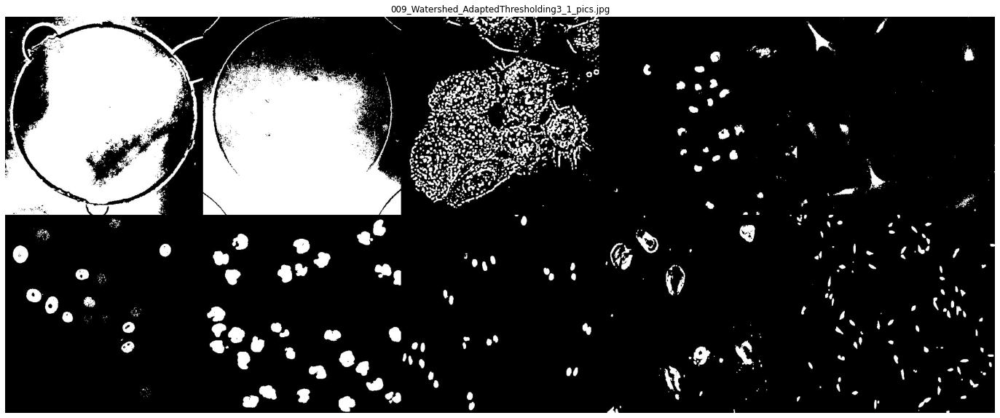

In [23]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted3(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "009_Watershed_AdaptedThresholding3_1_pics.jpg")

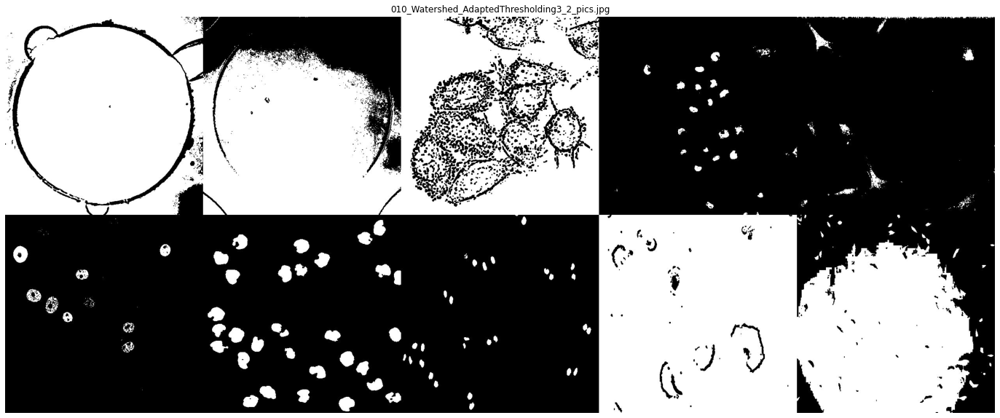

In [24]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted3(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "010_Watershed_AdaptedThresholding3_2_pics.jpg")

Let us keep going:

In [25]:
def watershedThresholdingAdapted4(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_TRUNC)

    return thresh

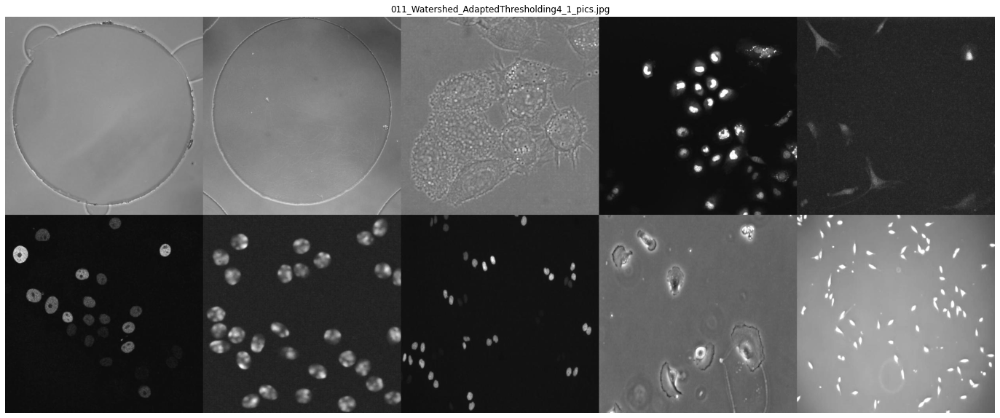

In [26]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted4(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "011_Watershed_AdaptedThresholding4_1_pics.jpg")

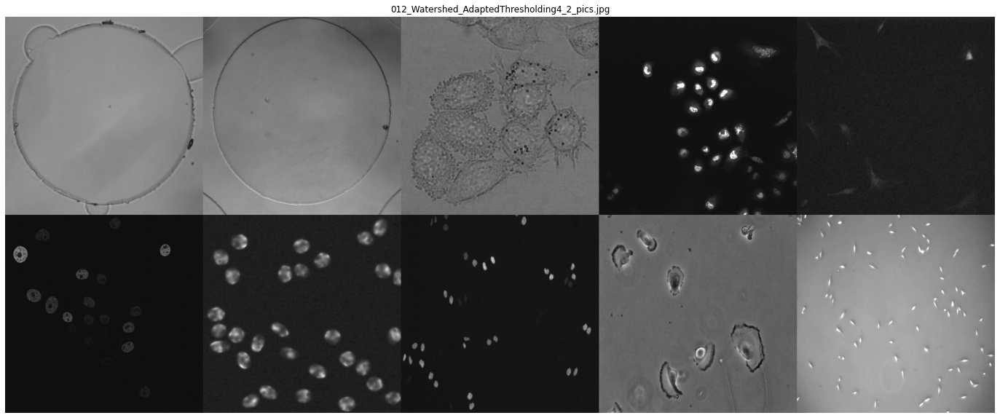

In [27]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted4(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "012_Watershed_AdaptedThresholding4_2_pics.jpg")

That did nothing! Let us try other combinations:

In [28]:
def watershedThresholdingAdapted5(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_TRIANGLE)

    return thresh

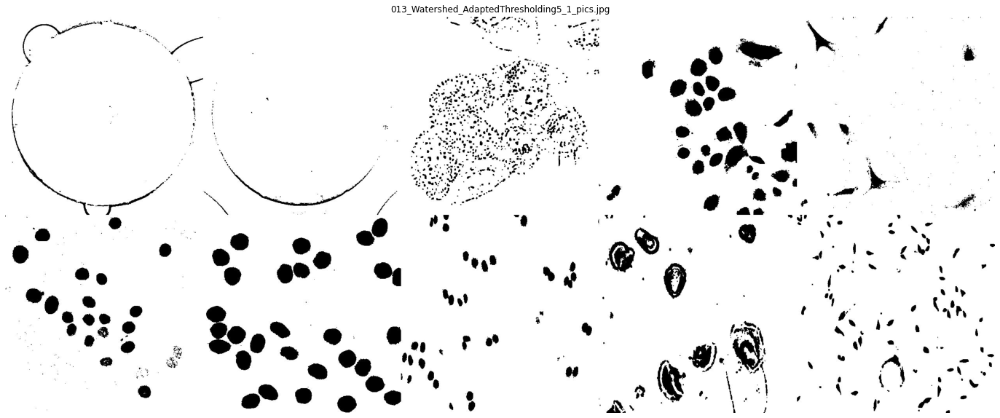

In [29]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted5(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "013_Watershed_AdaptedThresholding5_1_pics.jpg")

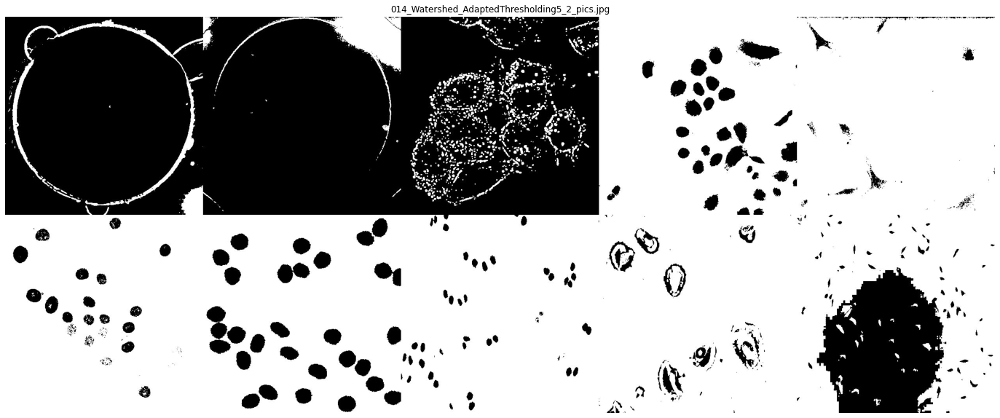

In [30]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted5(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "014_Watershed_AdaptedThresholding5_2_pics.jpg")

That top 1 is amazing! What does the triangle do by itself?

In [31]:
def watershedThresholdingAdapted6(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_TRIANGLE)

    return thresh

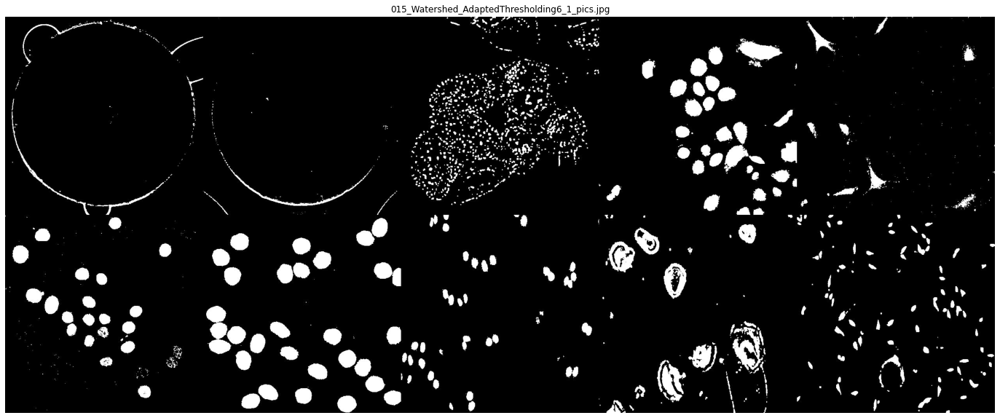

In [32]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted6(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "015_Watershed_AdaptedThresholding6_1_pics.jpg")

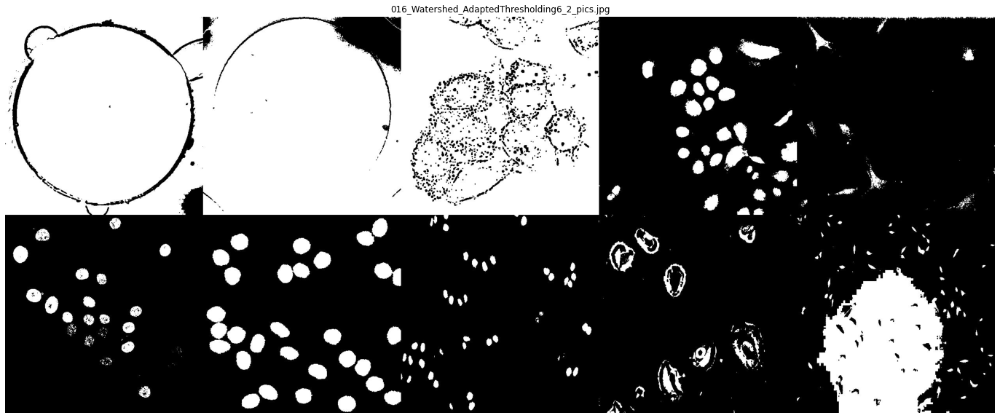

In [33]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted6(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "016_Watershed_AdaptedThresholding6_2_pics.jpg")

That top one may be our best option yet! Though the 3rd data-set is barely noticeable

Let us finish these combinations for now:

In [34]:
def watershedThresholdingAdapted7(img):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C + cv2.THRESH_TRIANGLE)

    return thresh

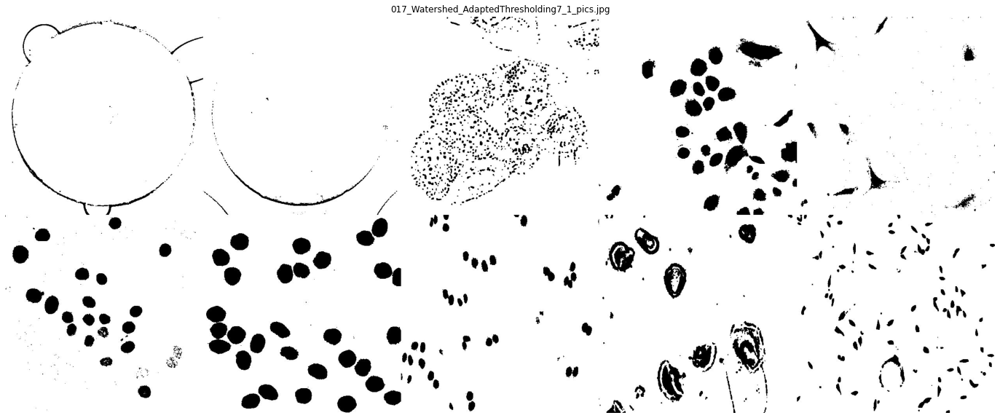

In [35]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted7(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "017_Watershed_AdaptedThresholding7_1_pics.jpg")

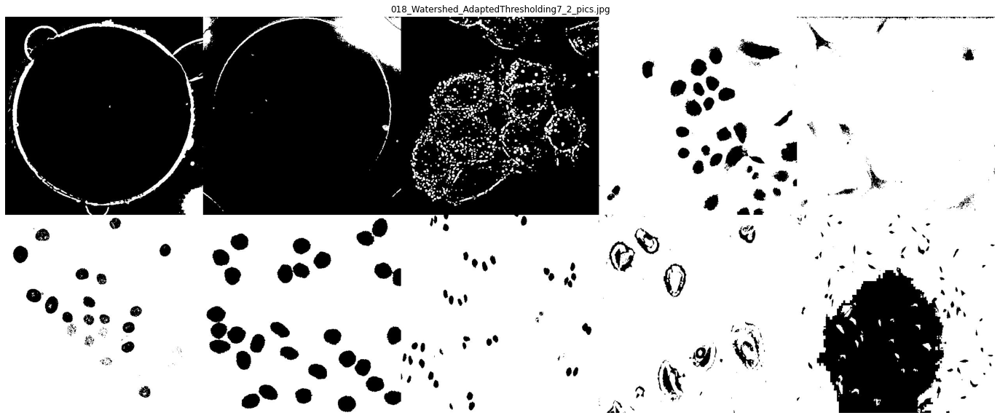

In [36]:
image_collection = []

for i in range(len(location2_pics)):
    image = location2_pics[i]

    watershed_image = watershedThresholdingAdapted7(image)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "018_Watershed_AdaptedThresholding7_2_pics.jpg")

That top one, inverted may be pleasant:

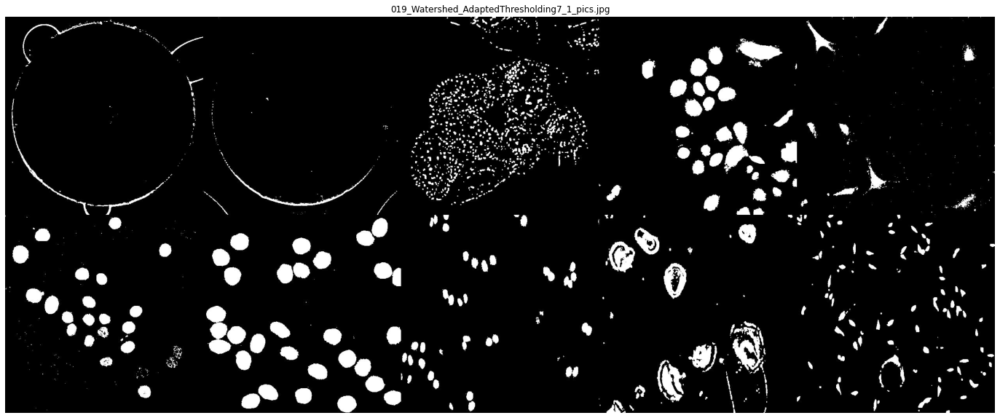

In [37]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdapted7(image)
    negative_image = 255 - watershed_image

    image_collection.append(negative_image)

saveAndShow(destination_directory, image_collection, "019_Watershed_AdaptedThresholding7_1_pics.jpg")

We can consider replacing the successful ones of these images into our watershed algorithm and see if that helps things!

Of those thresholded Images, the best performing Images appear to be 13, 15, 17, 19. Let us place them together to compare, before attempting to further explore watershed. Thereafter we can replace the best threshold inside Watershed to see if that improves things

Because of lighting, let us group  13 and 17 together:

![013](007_Initial_Segmentation\013_Watershed_AdaptedThresholding5_1_pics.jpg "013")
![017](007_Initial_Segmentation\017_Watershed_AdaptedThresholding7_1_pics.jpg "017")

Looks identical...

![015](007_Initial_Segmentation\015_Watershed_AdaptedThresholding6_1_pics.jpg "015")
![019](007_Initial_Segmentation\019_Watershed_AdaptedThresholding7_1_pics.jpg "019")


Looks identical...

To explain why these results are similar, we can read up on #ThresholdTypes in the OpenCV documentation. We find the following information:


In [38]:
'''
# C++ object for OpenCV
enum ThresholdTypes
{
    THRESH_BINARY     = 0,
    THRESH_BINARY_INV = 1,
    THRESH_TRUNC      = 2,
    THRESH_TOZERO     = 3,
    THRESH_TOZERO_INV = 4,
    THRESH_MASK       = 7,
    THRESH_OTSU       = 8,
    THRESH_TRIANGLE   = 16,
};

# also:
... 
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C = 1
...

'''

'\n# C++ object for OpenCV\nenum ThresholdTypes\n{\n    THRESH_BINARY     = 0,\n    THRESH_BINARY_INV = 1,\n    THRESH_TRUNC      = 2,\n    THRESH_TOZERO     = 3,\n    THRESH_TOZERO_INV = 4,\n    THRESH_MASK       = 7,\n    THRESH_OTSU       = 8,\n    THRESH_TRIANGLE   = 16,\n};\n\n# also:\n... \n    cv2.ADAPTIVE_THRESH_GAUSSIAN_C = 1\n...\n\n'

So:

13 has cv2.THRESH_BINARY_INV + cv2.THRESH_TRIANGLE === 1 + 16 === 17

15 has cv2.THRESH_TRIANGLE === 16

17 has cv2.ADAPTIVE_THRESH_GAUSSIAN_C + cv2.THRESH_TRIANGLE === 1 + 16 === 17

19 has negative of 17 == ???

So, the reason 13 and 17 are identical is because the argument is the same! However, the reason for 15 and 19 being similar is not clear, just by looking at the end images... Something involving the inverted/negative image is responsible for this

Let us retry Watershed, using one of the whiter images, and see what happens:

In [39]:
# as per OpenCV documentation, threshold_value should lie between 0 and 16
def watershedSegmentationTwo(img, threshold_value):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, threshold_value)

    # noise removal
    kernel = np.ones((3,3),np.uint8)
    # print(kernel)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations = 2)

    # sure background area
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Finding sure foreground area
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Finding unknown region
    unsure_pic = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, unsure_pic)

    # Marker labelling
    ret, markers = cv2.connectedComponents(unsure_pic)

    # Add one to all labels so that sure background is not 0, but 1
    markers = markers + 1

    # Now, mark the region of unknown with zero
    markers[unknown==255] = 0

    # NOW - Watershed method
    watershedImage = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    finalMarkers = cv2.watershed(watershedImage, markers) #! needs colour image

    watershedImage[finalMarkers == -1] = [255, 0, 0]
    watershedImage = cv2.cvtColor(watershedImage, cv2.COLOR_BGR2GRAY) #! convert back to grayscale

    return watershedImage
###

def watershedThresholdingAdaptedTwo(img, threshold_value):
    # threshold
    ret, thresh = cv2.threshold(img, 0, 255, threshold_value)

    return thresh
###

Because 15 and 19 are similar, perhaps the function uses a modular arithmetic system to reduce large threshold values? i.e. 17 --> 1 due to the modular arithmetic of base 16?

Let us check:

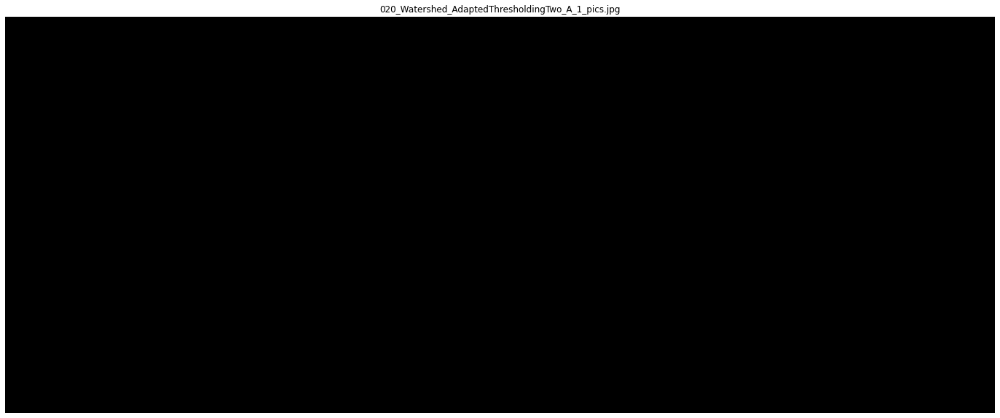

In [40]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 1)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_A_1_pics.jpg")

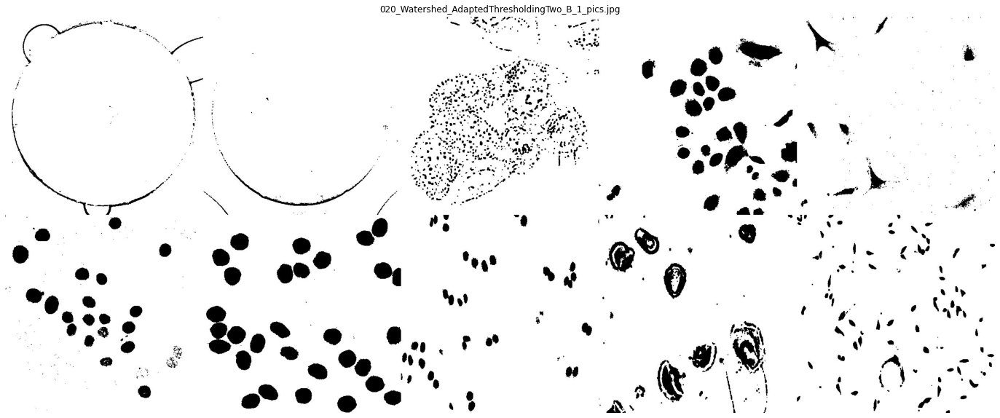

In [41]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 17)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_B_1_pics.jpg")

No! The values are ot cyclic, at least not at value 17

Let us try again with a much larger value to see what happens:

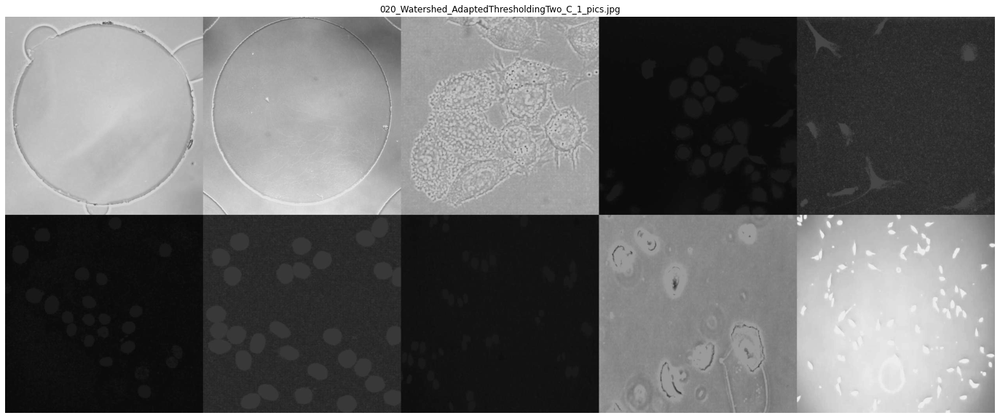

In [42]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 18)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_C_1_pics.jpg")

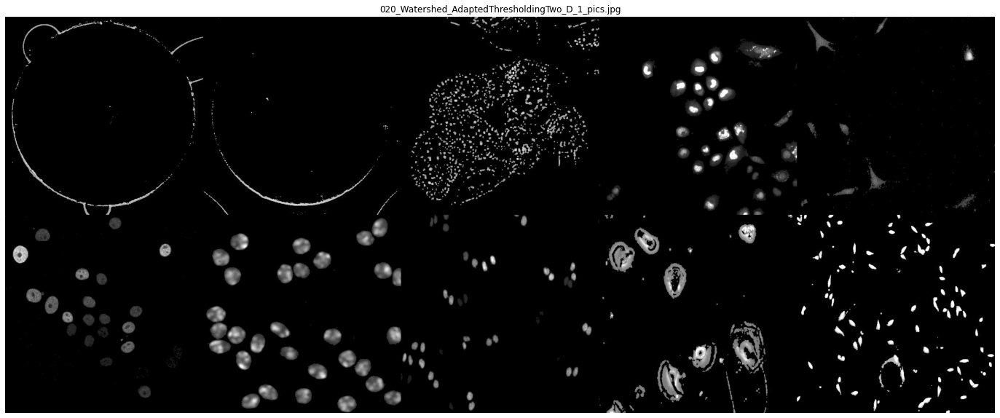

In [43]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 19)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_D_1_pics.jpg")

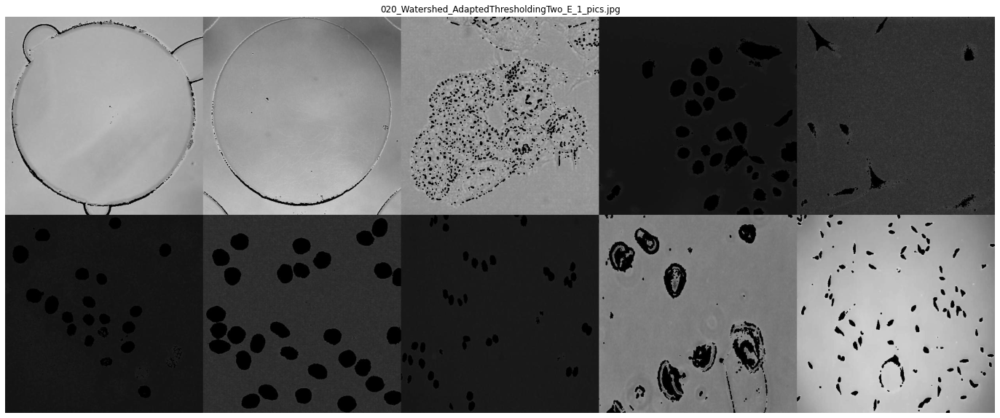

In [44]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 20)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_E_1_pics.jpg")

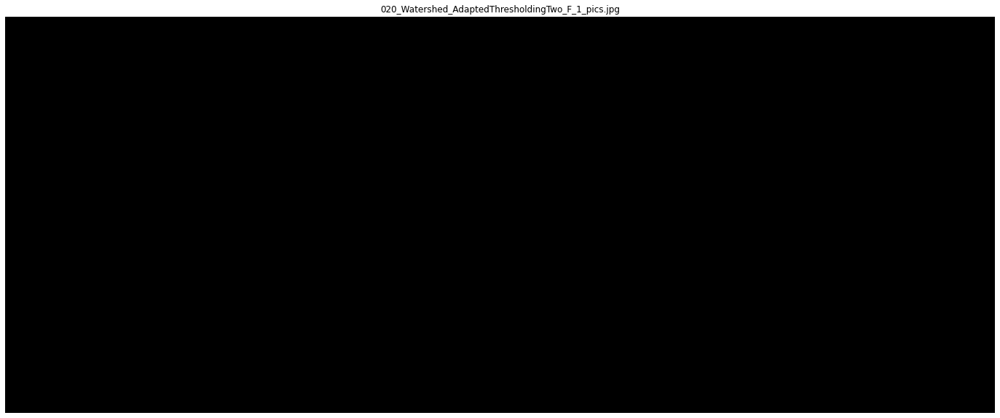

In [45]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 21)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "020_Watershed_AdaptedThresholdingTwo_F_1_pics.jpg")

Aha! Perhaps it is cyclic, but using Base 20?

let us compare 16 and 36:

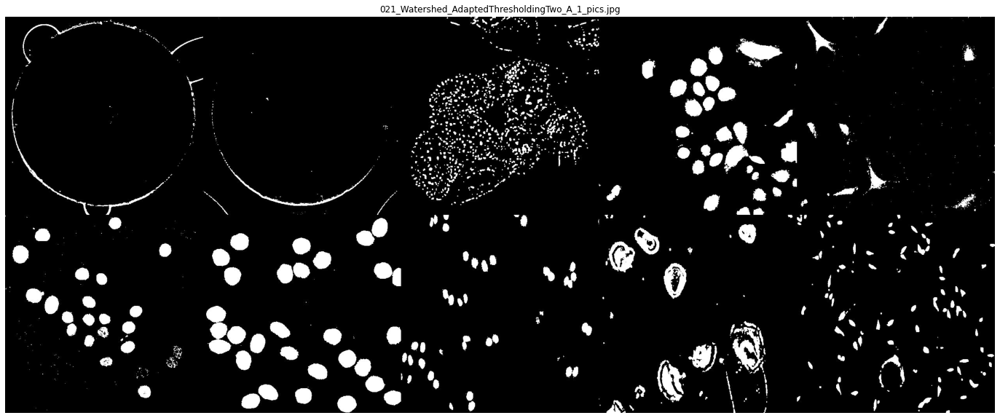

In [46]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 16)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "021_Watershed_AdaptedThresholdingTwo_A_1_pics.jpg")

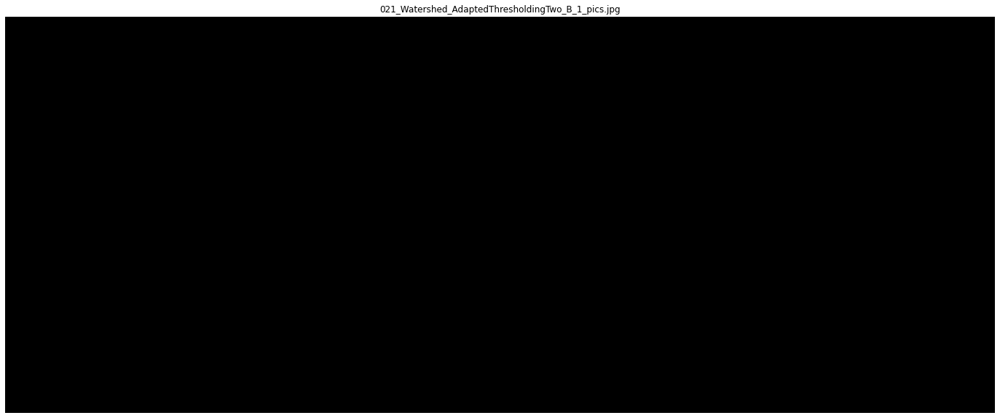

In [47]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedThresholdingAdaptedTwo(image, 36)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "021_Watershed_AdaptedThresholdingTwo_B_1_pics.jpg")

Nope! It is not cyclic, however the values between 1 and 20 appear valid. Perhaps anything else is treated as a 1?

Let us run through all of the valid options manually and show them, then select the bright ones:

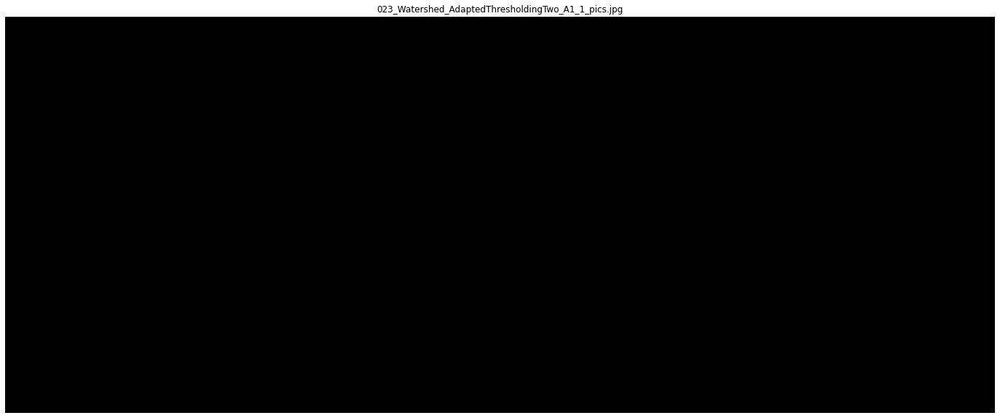

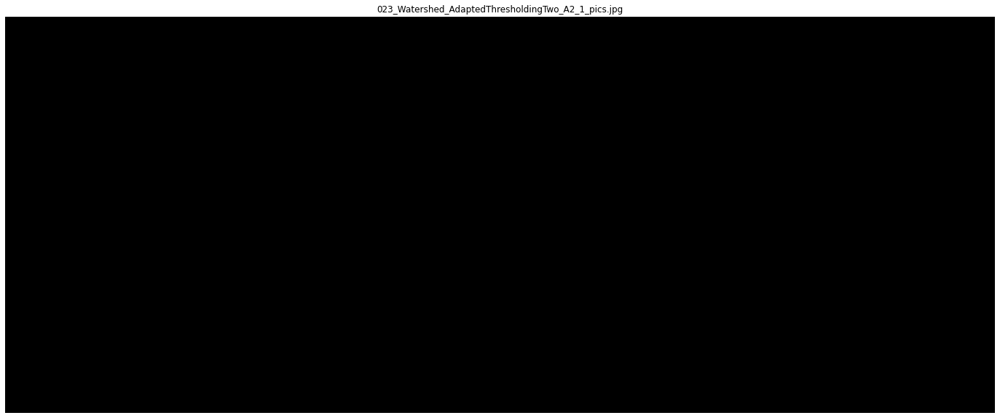

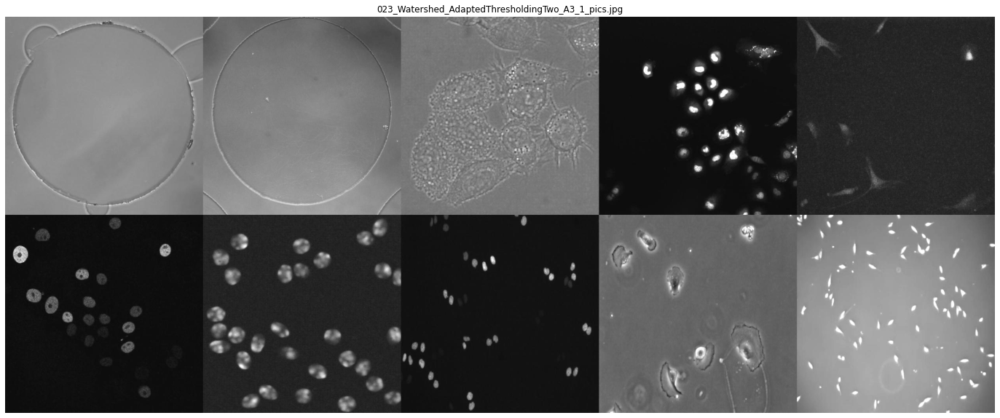

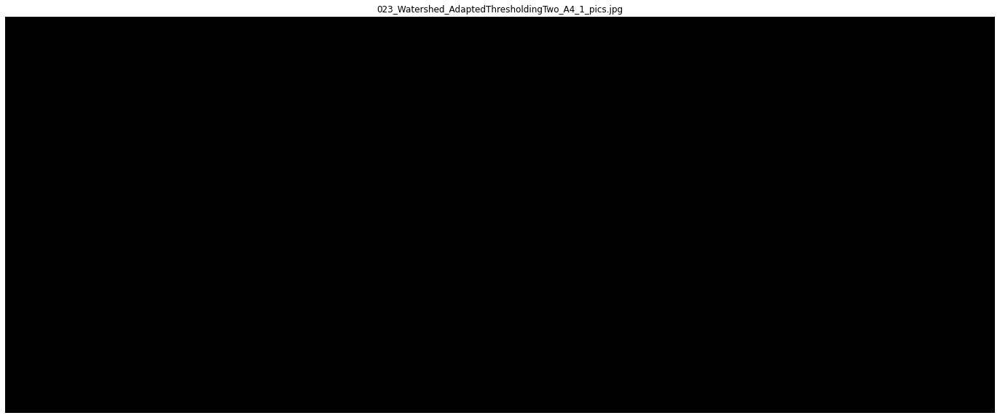

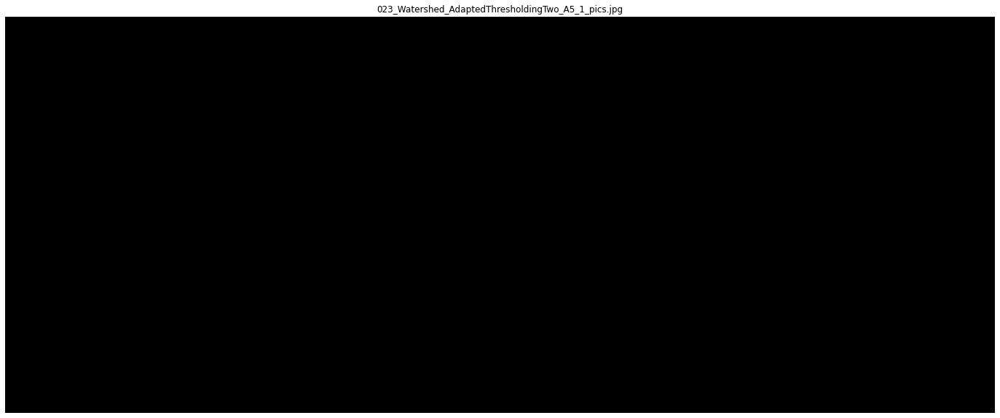

...

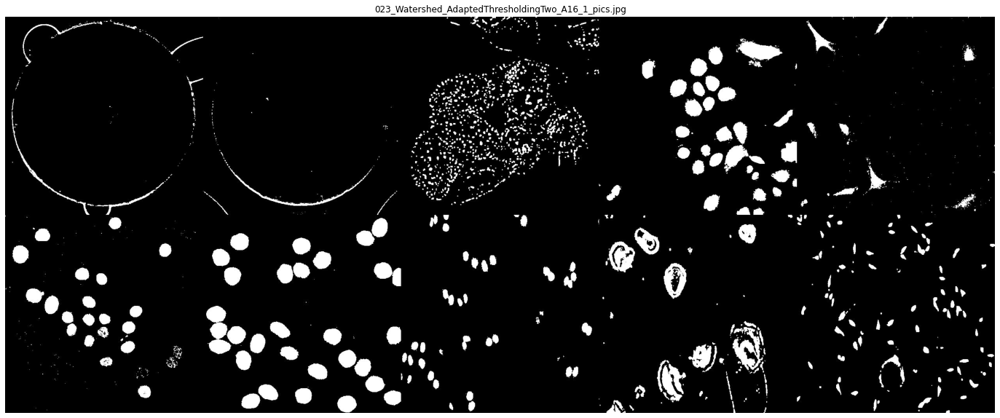

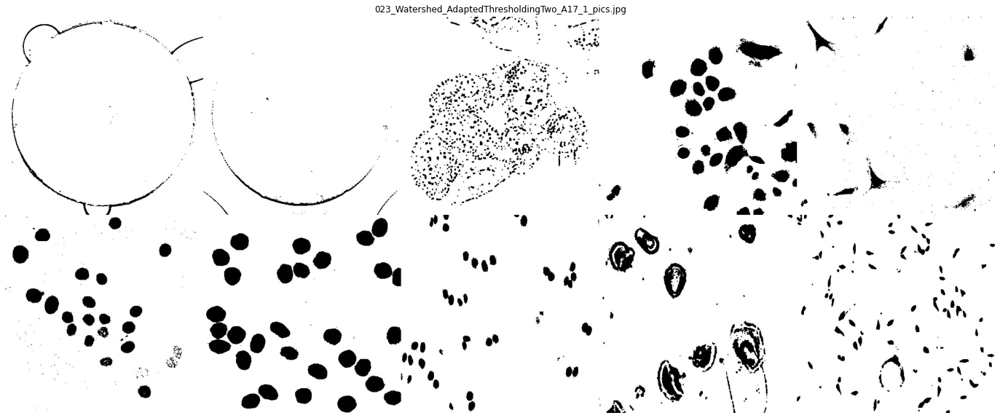

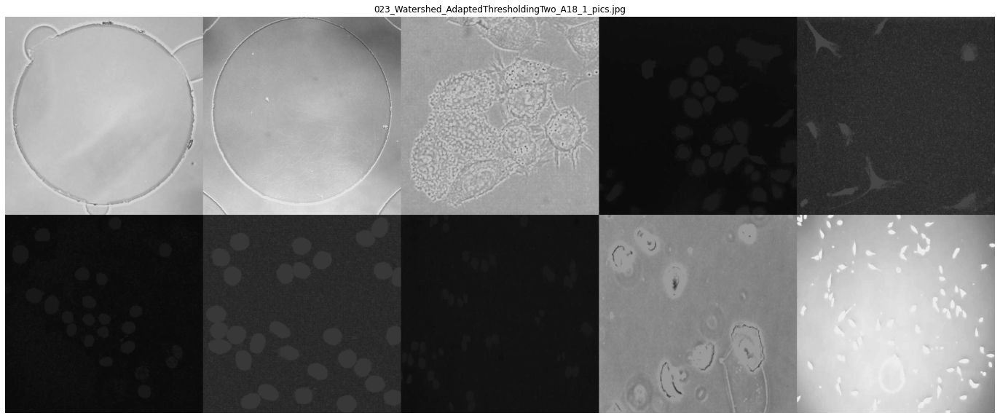

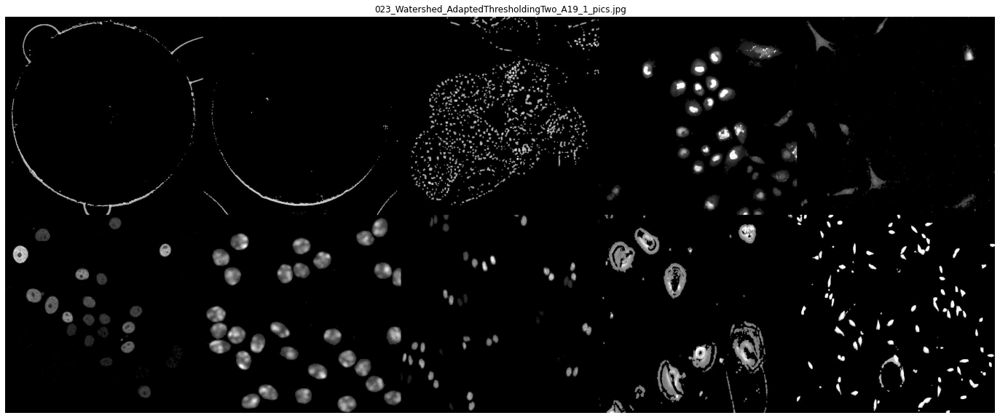

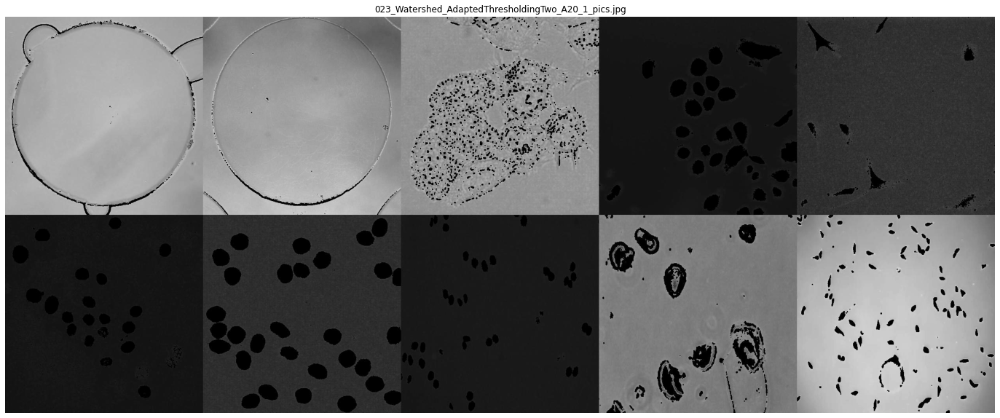

In [48]:
for j in range(1, 21):
    image_collection = []

    for i in range(len(location1_pics)):
        image = location1_pics[i]

        watershed_image = watershedThresholdingAdaptedTwo(image, j)

        image_collection.append(watershed_image)

    saveAndShow(destination_directory, image_collection, "023_Watershed_AdaptedThresholdingTwo_A" + str(j) + "_1_pics.jpg")

After that investigation, the valid options include: 3, 8, 9, 10, 11, 12, 16, 17, 18, 19, 20

Of those, the only bright options are: 9 and 17

Let us try and see if things are better with those values:

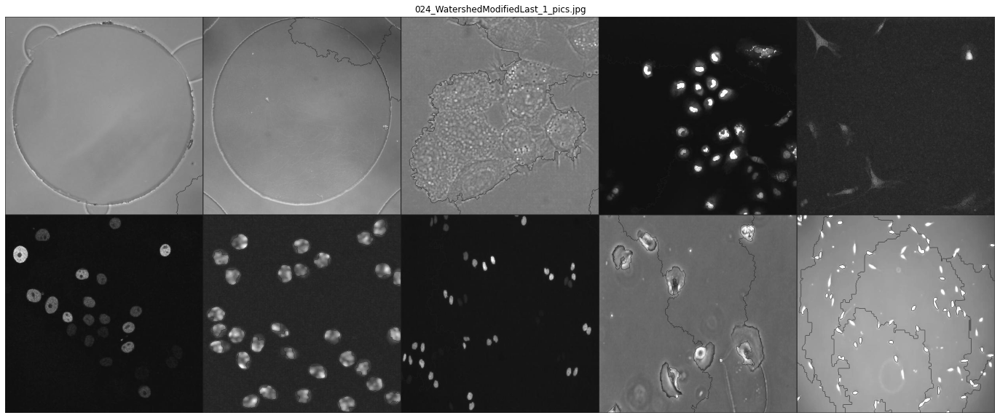

In [49]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedSegmentationTwo(image, 9)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "024_WatershedModifiedLast_1_pics.jpg")

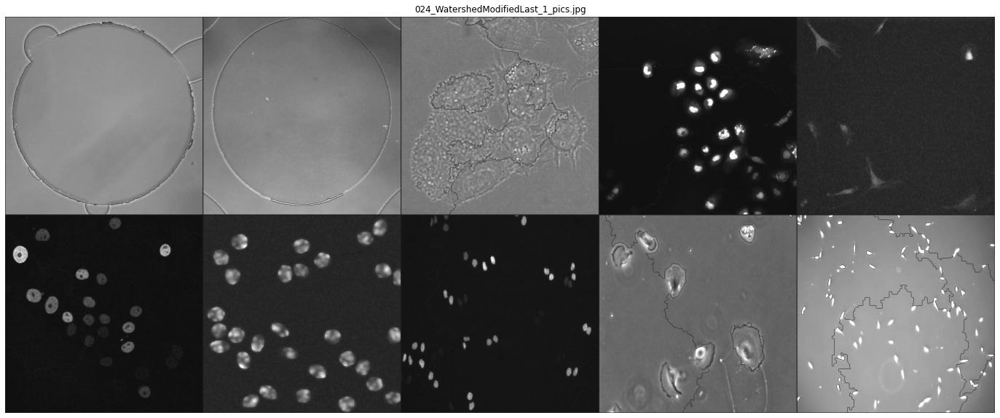

In [50]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    watershed_image = watershedSegmentationTwo(image, 17)

    image_collection.append(watershed_image)

saveAndShow(destination_directory, image_collection, "024_WatershedModifiedLast_1_pics.jpg")

## Watershed Conclusion

OpenCV Watershed may not be suitable. Let us consider different packages...

I found another representation using Skimage for Watershed method, let us try that as well:

In [51]:
from scipy import ndimage as ndi

from skimage.segmentation import watershed
from skimage.feature import peak_local_max

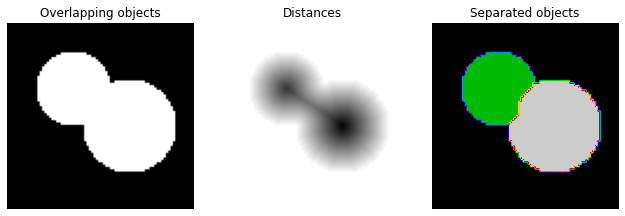

In [54]:
'''
Source:
https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_watershed.html
'''

#----------------------------------------------------------------------------
# Generate an initial image with two overlapping circles
#----------------------------------------------------------------------------

# each row has a value === index
x, y = np.indices((80, 80))
x1, y1, x2, y2 = 28, 28, 44, 52
r1, r2 = 16, 20
# generate circles using Boolean True and False == 1, 0
mask_circle1 = (x - x1)**2 + (y - y1)**2 < r1**2
mask_circle2 = (x - x2)**2 + (y - y2)**2 < r2**2

# False and True for each entry
image = np.logical_or(mask_circle1, mask_circle2)
# print(image)

#----------------------------------------------------------------------------
# Now we want to separate the two objects in image
#----------------------------------------------------------------------------

# Generate the markers as local maxima of the distance to the background
distance = ndi.distance_transform_edt(image)
coords = peak_local_max(distance, footprint=np.ones((3, 3)), labels=image)
mask = np.zeros(distance.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
labels = watershed(-distance, markers, mask=image)

fig, axes = plt.subplots(ncols=3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray)
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral)
ax[2].set_title('Separated objects')

for a in ax:
    a.set_axis_off()

fig.tight_layout()
plt.show()

Let's create some functions to do that for all 10 images, and stitch the pictures together:

In [75]:
def getDistanceMaps(image):
    distance = ndi.distance_transform_edt(image)
    return distance
###

def scikitWatershed(image):
    distance = getDistanceMaps(image)
    coords = peak_local_max(distance, footprint=np.ones((3, 3)), labels=image)
    mask = np.zeros(distance.shape, dtype=bool)
    mask[tuple(coords.T)] = True
    markers, _ = ndi.label(mask)
    labels = watershed(-distance, markers, mask=image)   

    # ensure Grayscale image using Pillow
    new_img = fromarray(labels).convert("RGB")

    return new_img
### 

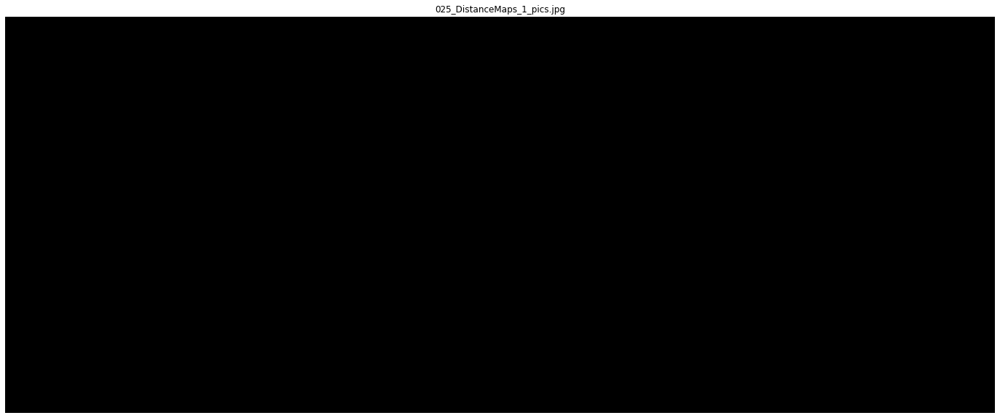

In [74]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    distance_image = getDistanceMaps(image)

    # ensure Grayscale image using Pillow
    new_img = fromarray(-distance_image).convert("L")

    image_collection.append(new_img)

saveAndShow(destination_directory, image_collection, "025_DistanceMaps_1_pics.jpg")

That didnt help... What about the entire Watershed?


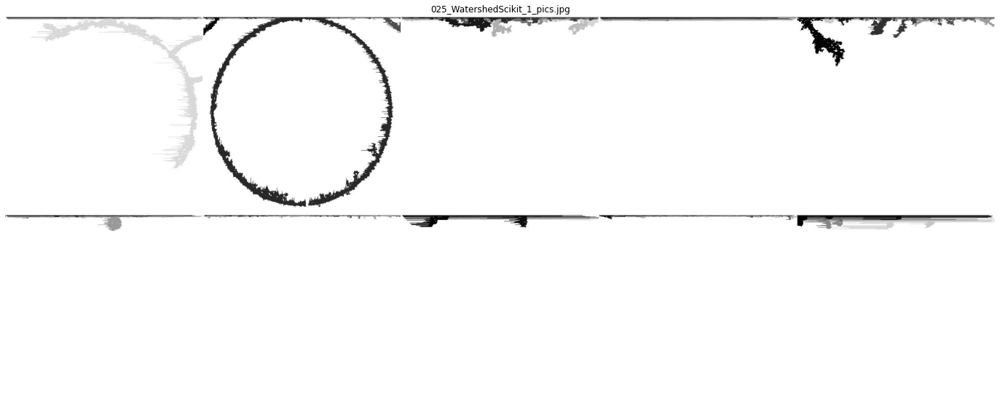

In [76]:
image_collection = []

for i in range(len(location1_pics)):
    image = location1_pics[i]

    new_img = scikitWatershed(image)

    image_collection.append(new_img)

saveAndShow(destination_directory, image_collection, "025_WatershedScikit_1_pics.jpg")

WoW! That is terrible!

Let us attempt other segmentation methods in another notebook, as this one is getting long

Before we move on, let us load 10 un-processed images and attempt watershed:


In [77]:
location3 = "..\\..\\Comp700_DataSets\\Extracted"
location3_pics = getFirstTenPics(location1, directory_array)

print( len(location3_pics) )

10


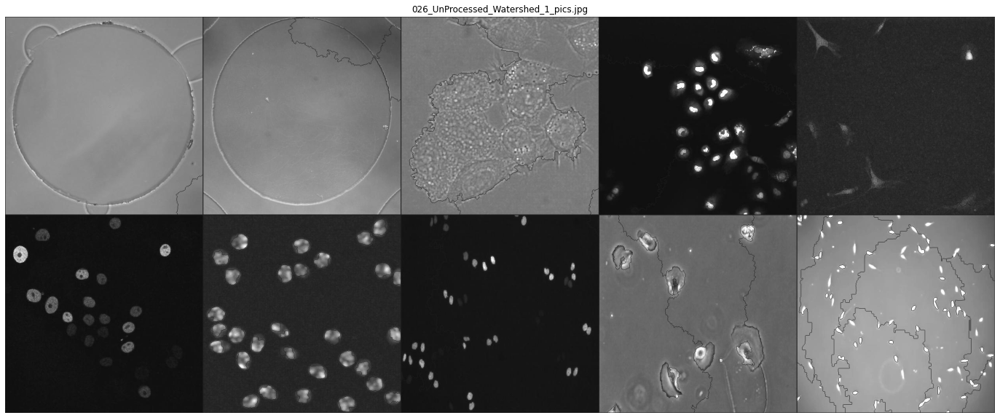

In [78]:
image_collection = []

for i in range(len(location3_pics)):
    image = location3_pics[i]

    new_img = watershedSegmentation(image)

    image_collection.append(new_img)

saveAndShow(destination_directory, image_collection, "026_UnProcessed_Watershed_1_pics.jpg")

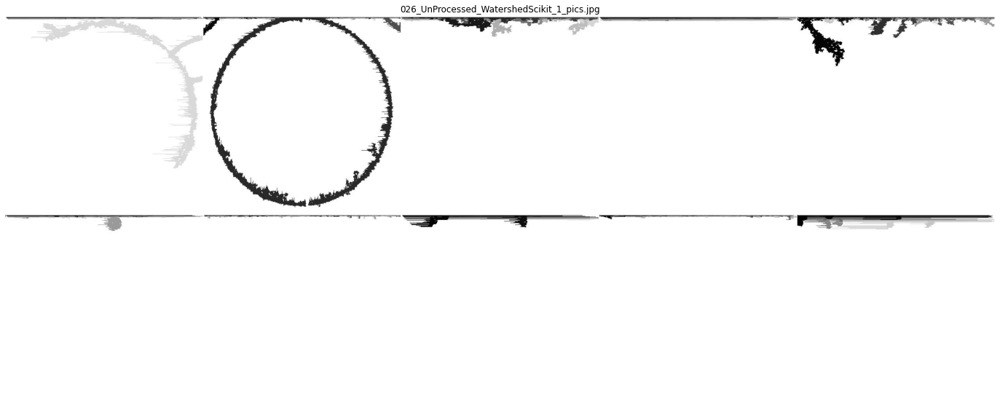

In [79]:
image_collection = []

for i in range(len(location3_pics)):
    image = location3_pics[i]

    new_img = scikitWatershed(image)

    image_collection.append(new_img)

saveAndShow(destination_directory, image_collection, "026_UnProcessed_WatershedScikit_1_pics.jpg")

No! Perhaps I am implementing the Scikit Watershed incorrectly. Let us move on to other segmentation options

# Conclusion
This section of the notebook summarises the knowledge so far

Unfortunately, the Watershed segmentation is not working, most likely because of the thresholding of the images. This may be compounded by our pre-processing step - however, because the pre-processing was a simple morphological operation the results are almost the same

The best image is shown below:

![Negative of OpenCV Threshold value 17](007_Initial_Segmentation\\019_Watershed_AdaptedThresholding7_1_pics.jpg "Negative of OpenCV Threshold value 17")

What makes that image successful is the OpenCV use of a threshold mask value 17. Other values were explored, however this is the best result! It also assists with removal of noise to a high degree, though the 3rd data-set is broken into many smaller pieces

In the next notebook, we will explore other segmentation techniques